# 2) Analysis:

Here, we will evaluate the WGANGP training for tuberculose class.

In [2]:
import pandas as pd
import numpy as np
import json
import glob
import matplotlib.pyplot as plt
from rxwgan.models import Generator_v2 as Generator
from rxwgan.models import Critic_v2 as Critic
from rxwgan.core.stats import calculate_divergences, calculate_l1_and_l2_norm_errors
from rxwgan.core.stratified_kfold import stratified_train_val_test_splits

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import StratifiedKFold
from pprint import pprint
import tensorflow as tf
import os
from tqdm import tqdm
import atlas_mpl_style as ampl
ampl.use_atlas_style()

%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

import logging
logging.getLogger('matplotlib.font_manager').disabled = True

2023-01-04 16:20:50.978446: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-04 16:20:53.039668: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-04 16:20:53.042127: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-04 16:20:53.042267: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least on

## 3.1) Load files:

In [3]:
data_path   = '/home/joao.pinto/public/brics_data/SantaCasa/raw/SantaCasa_table_from_raw_splitted.csv'
model_path  = '/home/joao.pinto/public/brics_data/SantaCasa/models/user.joao.pinto.task.SantaCasa.wgan.v2_notb.r1'
output_path = 'output/notb'
os.makedirs(output_path, exist_ok=True)

In [4]:
data_df = pd.read_csv(data_path)

In [5]:
data_df.shape

(7920, 10)

In [6]:
data_df.head()

,Unnamed: 0,target,image_ID,raw_image_path,raw_image_md5,run,test,sort,dataset,type
0,0,0,image_20220315_184023_414198,/home/joao.pinto/public/brics_data/SantaCasa/r...,08de3b74c0ea27cff51de66a956c1cd4,SantaCasa,0,0,train,real
1,1,0,image_20220315_184432_B11816,/home/joao.pinto/public/brics_data/SantaCasa/r...,d85d703b36f43432da00f2904cb159eb,SantaCasa,0,0,train,real
2,3,0,image_20220315_184740_2D93D3,/home/joao.pinto/public/brics_data/SantaCasa/r...,e4a0f37025ed430ed65745cdf593357c,SantaCasa,0,0,train,real
3,4,0,image_20220315_185230_09A8AE,/home/joao.pinto/public/brics_data/SantaCasa/r...,91bcaaa15198d0fdd9c36721c6d530eb,SantaCasa,0,0,train,real
4,5,0,image_20220315_185346_EE823A,/home/joao.pinto/public/brics_data/SantaCasa/r...,90aa14ef4eb038986011b36f933e85bd,SantaCasa,0,0,train,real


### Special functions:

In [7]:


def create_table(basepath):
    
    keys = ['train_critic_loss', 'train_gen_loss', 'train_reg_loss', 'train_kl_rr', 
        'train_kl_rf', 'train_js_rr', 'train_js_rf', 'train_l1_rr', 'train_l1_rf', 
        'train_l2_rr', 'train_l2_rf', 'val_critic_loss', 'val_gen_loss', 'val_kl_rr', 
        'val_kl_rf', 'val_js_rr', 'val_js_rf', 'val_l1_rr', 'val_l1_rf', 'val_l2_rr', 
        'val_l2_rf']
    
    dataframe = {}
    dataframe['test']=[]
    dataframe['sort']=[]
    #dataframe['init']=[]
    dataframe['target']=[]
    for key in keys:
        dataframe[key]=[]
    dataframe['gen_path']=[]
    dataframe['critic_path']=[]
    dataframe['hist_path']=[] 
    dataframe['history'] = []
    
    
    for path in tqdm(glob.glob(basepath + '/*', recursive=False)):
        info = json.load(open(path+'/checkpoint.json'))
        dataframe['test'].append(info['test'])
        dataframe['sort'].append(info['sort'])
        dataframe['target'].append(info['target'])
    
        dataframe['hist_path'].append(path+'/history.json')
        dataframe['gen_path'].append(path+'/generator_trained.h5')
        dataframe['critic_path'].append(path+'/critic_trained.h5')

        history = json.load(open(path+'/history.json'))
        for key in keys:
            dataframe[key].append(history[key][-1])
            
        dataframe['history'].append(history)
                
    #for k in dataframe.keys():
    #    print( '%s - %d'%(k,len(dataframe[k])))
    return pd.DataFrame(dataframe)

def get_values( hs, key ):
    return np.array([h.history[key] for _, h in hs.iterrows()])

def rotate_func(image):
        return tf.image.rot90(image, k=3)

def load_images( df, height, width , tot=None, rot=False):
    # image generator
    if rot:
        datagen = ImageDataGenerator( rescale=1./255, preprocessing_function=rotate_func)
    else:
        datagen = ImageDataGenerator( rescale=1./255 )
    generator = datagen.flow_from_dataframe(df, directory = None,
                            x_col = 'raw_image_path', 
                            y_col = 'target',
                            target_size = (height,width),
                            batch_size=1,
                            class_mode = 'raw', 
                            shuffle = False,
                            color_mode = 'grayscale')
    data = None
    for _ in range(df.shape[0] if not tot else tot) :
        d, _ = generator.next()
        if data is not None:
            data = np.concatenate((data, d), axis=0)
        else:
            data=d
    return data

def display_images(fake_samples):
    # disp plot
    fig = plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3,3,1+i)
        plt.axis('off')
        plt.imshow(fake_samples[i],cmap='gray')
    return fig


def plot_hist( a, b , xmin, xmax, bins=100, ylim_top=None, ylim_bot=None, xlabel='', 
               colors=['black', 'tomato'], ylabel=('Count',''), density=False, 
              labels=('a','b','a/b'), alpha=0.3, ylog=False, title=None):
    
    fig, (ax_top, ax_bot) = plt.subplots(2, 1, figsize=(10, 9), 
                                         sharex=True, 
                                         gridspec_kw={'height_ratios' : [2.5, 1.]})
    
    binwidth = (xmax-xmin)/bins
    bins_vec=np.arange(xmin, xmax + binwidth, binwidth)
    
    if title:
        ax_top.set_title(title)
    # plot histogram centered on values 0..255
    a_pdf = ax_top.hist(a, bins=bins_vec, histtype='step', color=colors[0], 
                             lw=1.5, label=labels[0], density=density)
    b_pdf = ax_top.hist(b, bins=bins_vec, histtype='stepfilled', color=colors[1], alpha=alpha,
                             lw=1.5, label=labels[1], density=density)
    
    bin_edges = a_pdf[1]
    
    ax_top.set_ylabel(ylabel[0], fontsize=18, loc='top')
    if ylog:
        ax_top.set_yscale('log')
    if ylim_top:
        ax_top.set_ylim(top=y_range_top)
    ax_top.legend(loc='best', fontsize=18)
    delta = a_pdf[0] - b_pdf[0]
    ax_bot.plot(bin_edges[0: -1] + np.diff(bin_edges)/2, delta, 'o', 
                color='black', fillstyle='full', 
                )
    
    ax_bot.legend(loc='best', fontsize=18)
    ax_bot.set_xlabel(xlabel, fontsize=18, loc='right')
    ax_bot.set_ylabel(ylabel[1], fontsize=18, loc='center')
    plt.tight_layout()
    plt.show()
    return fig, ax_top, ax_bot

## 3.2) Load tunings:

We will check the values for all 10 sorts.

In [8]:
model_df = create_table(model_path)
model_df.head()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 90/90 [00:00<00:00, 126.12it/s]


,test,sort,target,train_critic_loss,train_gen_loss,train_reg_loss,train_kl_rr,train_kl_rf,train_js_rr,train_js_rf,...,val_js_rr,val_js_rf,val_l1_rr,val_l1_rf,val_l2_rr,val_l2_rf,gen_path,critic_path,hist_path,history
0,8,8,False,-16.917656,-1.787117,4.523664,0.341804,0.205116,0.057812,0.056634,...,0.025622,0.065827,0.171249,0.178572,0.075631,0.078957,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,"{'train_critic_loss': [-2.8950531482696533, -4..."
1,0,5,False,-16.403864,-3.891145,4.951153,0.308433,0.323597,0.056523,0.094329,...,0.033134,0.065015,0.180233,0.187287,0.083694,0.086030,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,"{'train_critic_loss': [-1.6849473714828491, -2..."
2,2,6,False,-17.650564,-3.360386,3.690932,0.299759,0.237686,0.053804,0.072813,...,0.080491,0.078437,0.186292,0.180870,0.082923,0.079324,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,"{'train_critic_loss': [-4.418441295623779, -14..."
3,1,2,False,-18.613710,-11.997716,4.663116,0.269903,0.273646,0.049603,0.076106,...,0.094292,0.118219,0.189901,0.190823,0.083306,0.083954,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,"{'train_critic_loss': [-1.954572319984436, -88..."
4,8,4,False,-18.681358,14.766168,5.684875,0.337204,0.537162,0.057849,0.107102,...,0.027528,0.051301,0.173046,0.178056,0.079304,0.079032,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,/home/joao.pinto/public/brics_data/SantaCasa/m...,"{'train_critic_loss': [-2.412329912185669, -35..."


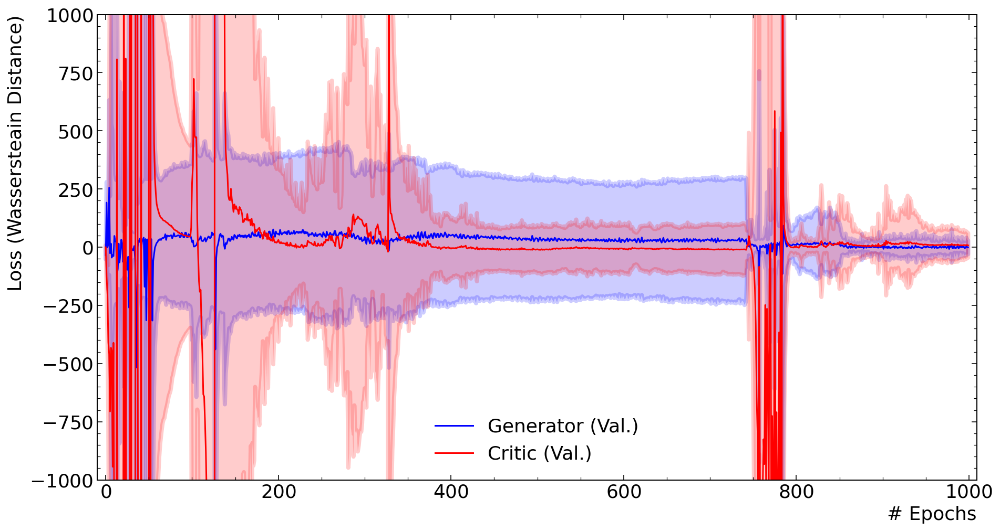

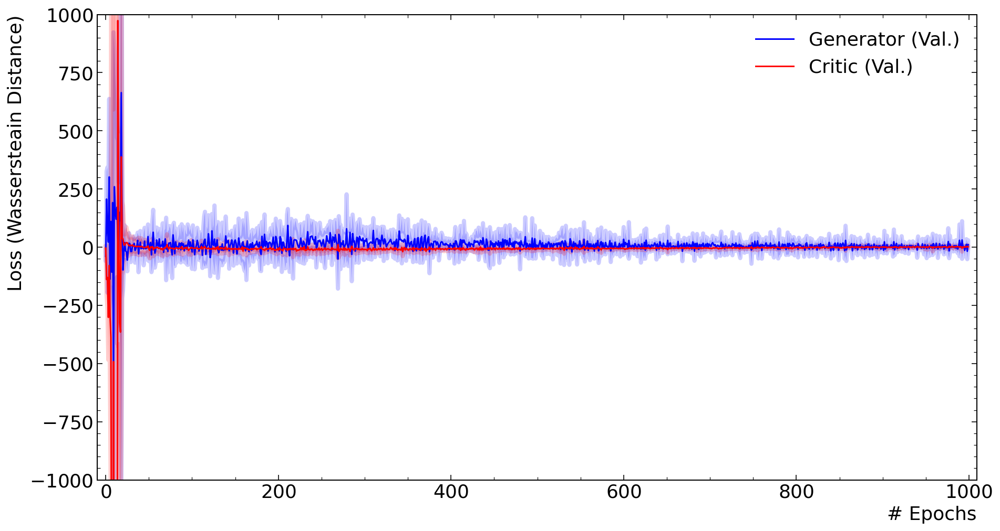

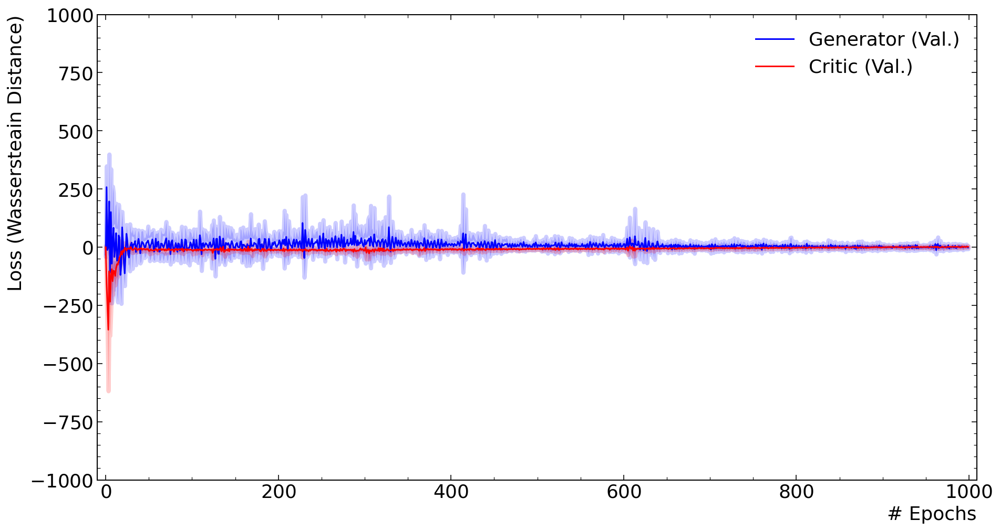

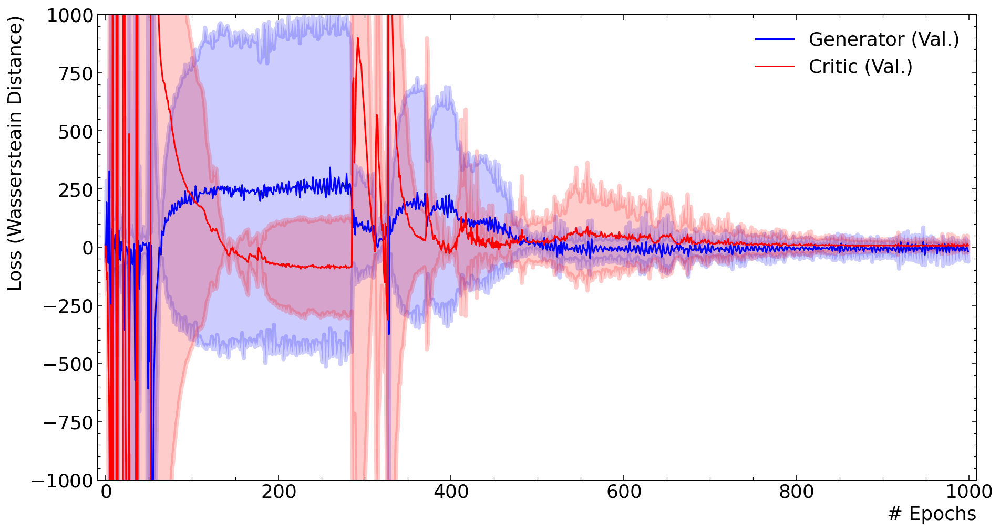

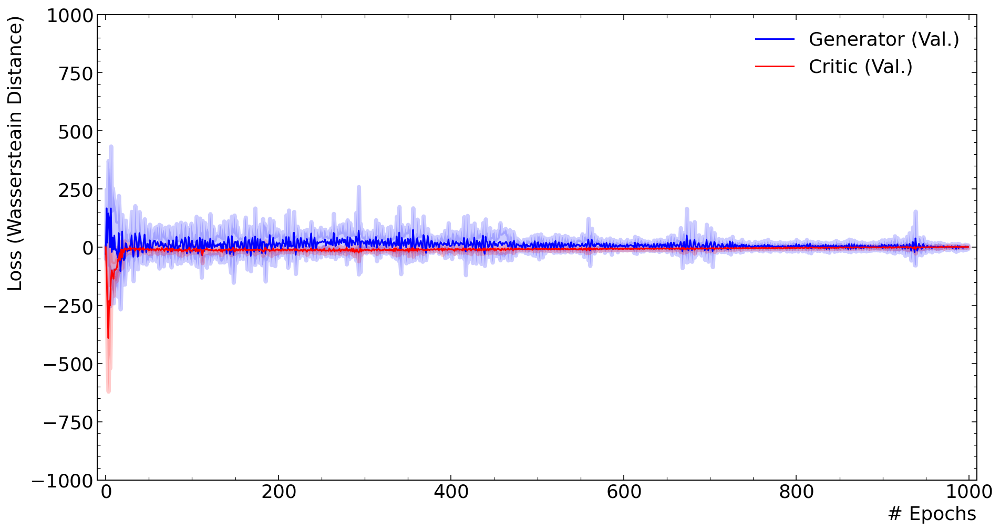

...

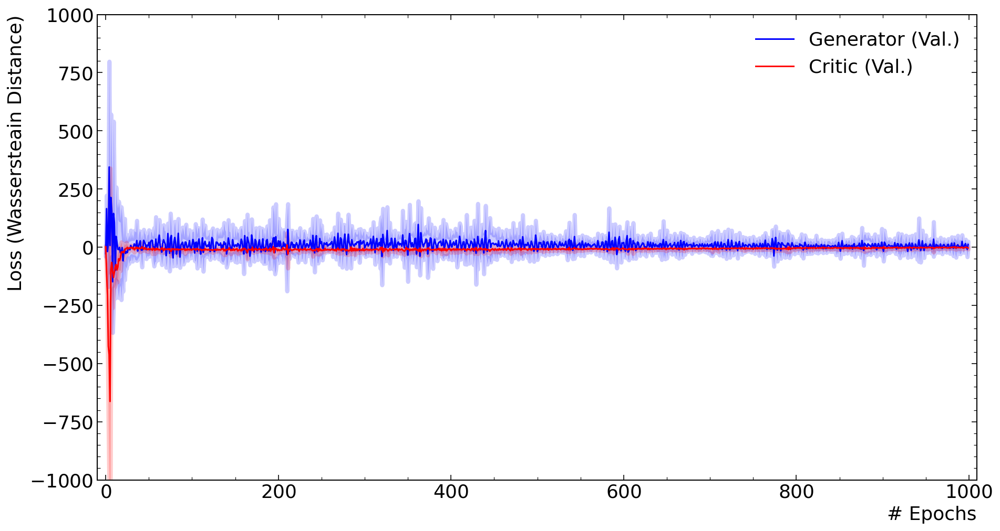

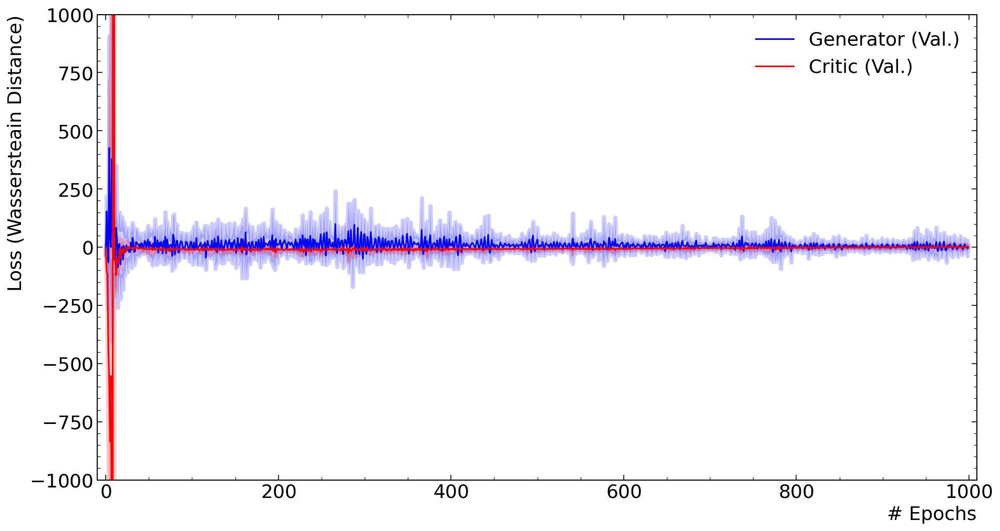

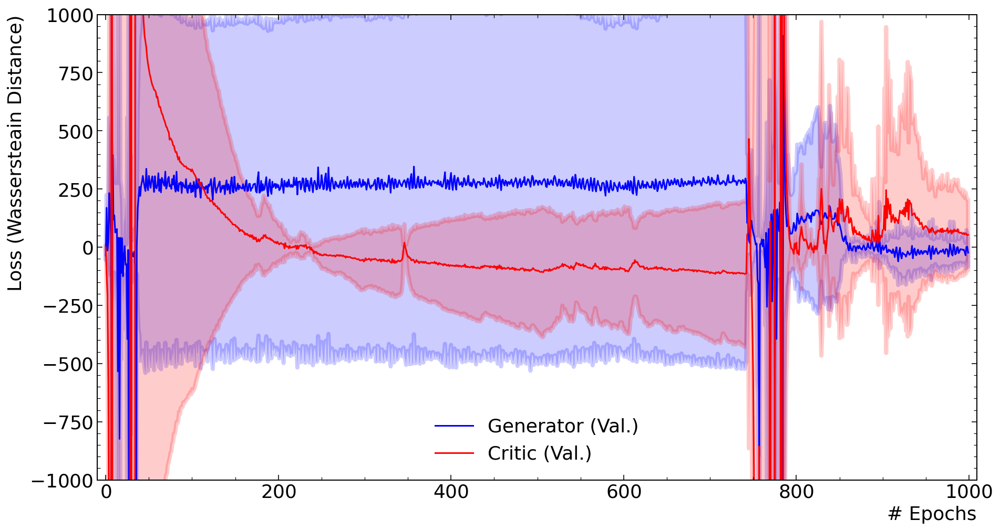

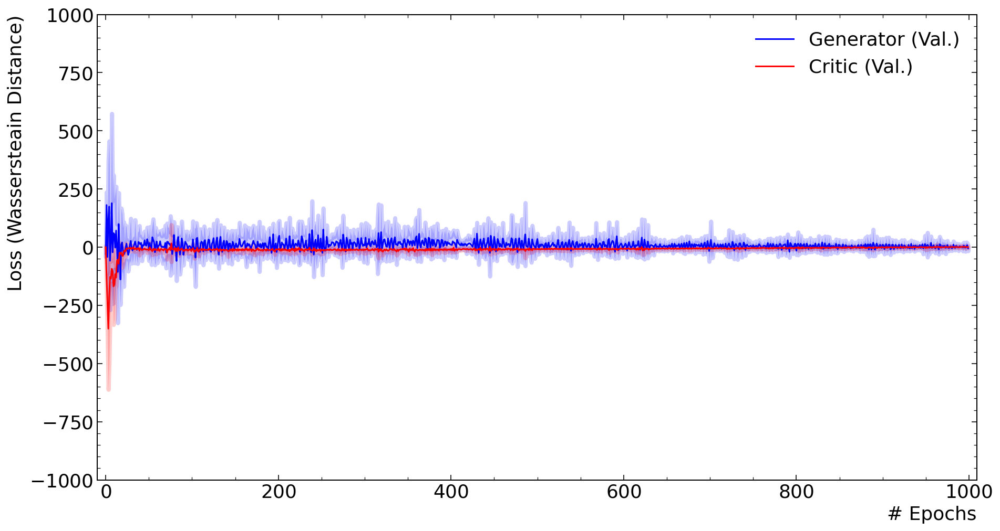

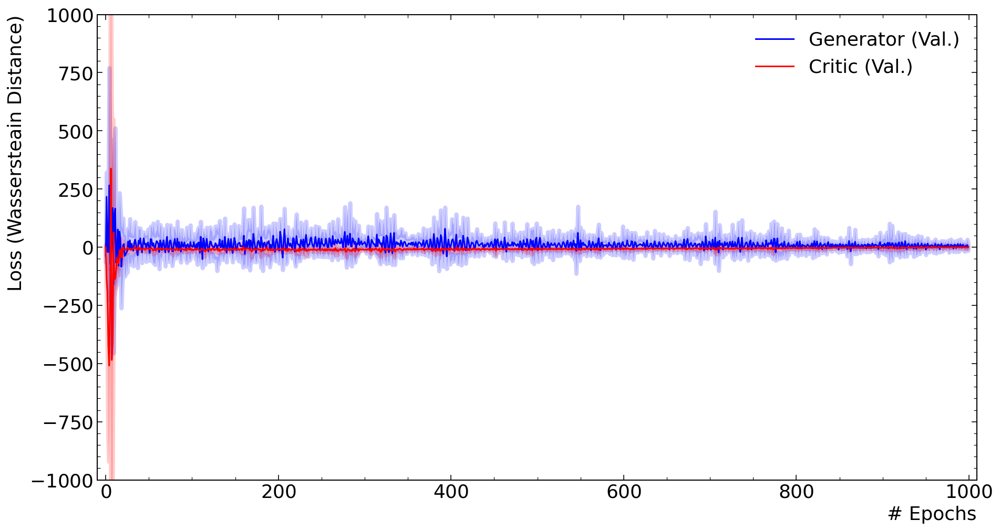

In [9]:

def plot_loss( df, output ):

    epochs = np.arange(0,1000,1)
    xmin = epochs[0]-10
    xmax = epochs[-1]+10
    fig = plt.figure(figsize=(15, 8))
    y_gen = get_values(df, 'val_gen_loss')
    y_gen_mean = y_gen.mean(axis=0)
    y_gen_std = y_gen.std(axis=0)
    plt.plot( epochs, y_gen_mean, label='Generator (Val.)', color='blue')
    plt.fill_between(epochs, y_gen_mean-y_gen_std, y_gen_mean+y_gen_std, alpha=0.2, antialiased=True, 
                 color='blue',linewidth=4)

    y_critic = get_values(df, 'val_critic_loss')
    y_critic_mean = y_critic.mean(axis=0)
    y_critic_std = y_critic.std(axis=0)
    plt.plot( epochs, y_critic_mean, label='Critic (Val.)', color='red')
    plt.fill_between(epochs, y_critic_mean-y_critic_std, y_critic_mean+y_critic_std, alpha=0.2, 
                 antialiased=True, color='red',linewidth=4)

    plt.ylabel('Loss (Wassersteain Distance)',fontsize=18,loc='top')
    plt.xlabel("# Epochs",fontsize=18,loc='right')
    ax = plt.gca()
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(-1000,+1000)
    plt.legend()
    plt.show()
    fig.savefig(output)
    
    
    
plot_loss(model_df, 'output/notb/val_loss.pdf')

for test in range(10):
    plot_loss(model_df.loc[model_df.test==test], 'output/notb/val_loss_test_%d.pdf'%test)

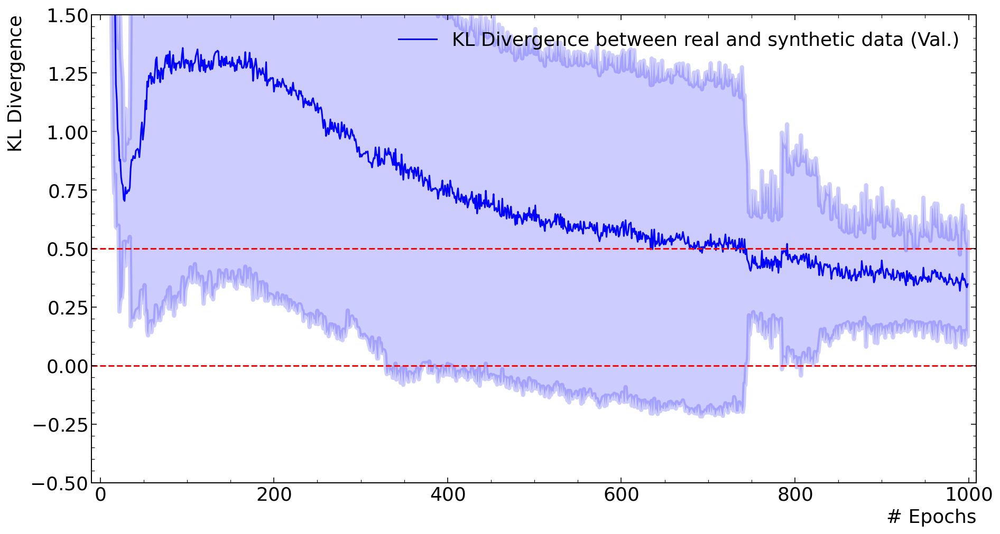

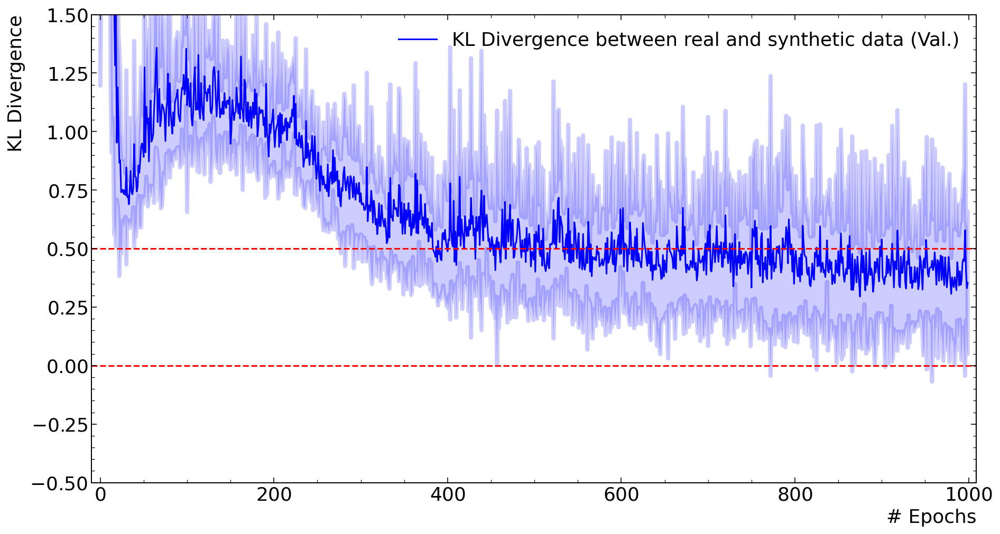

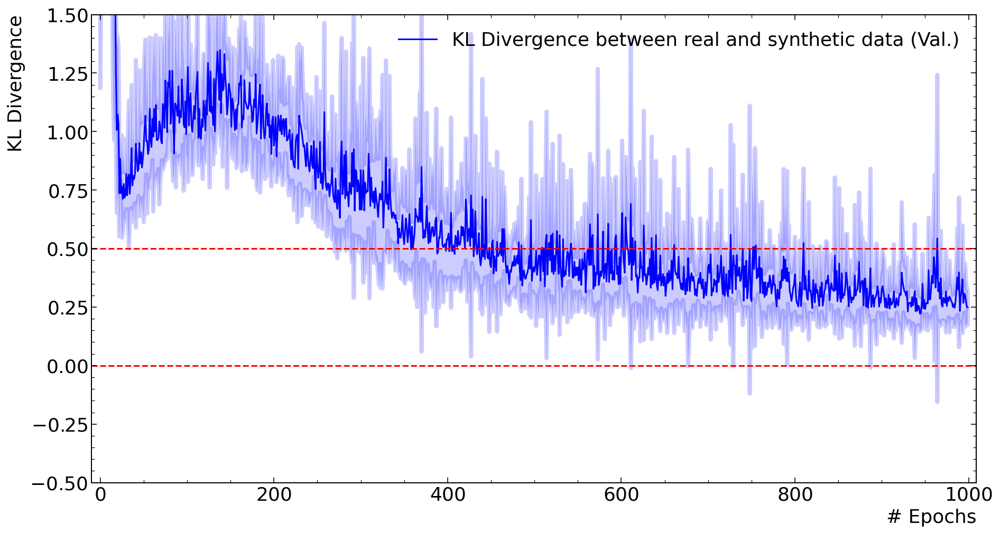

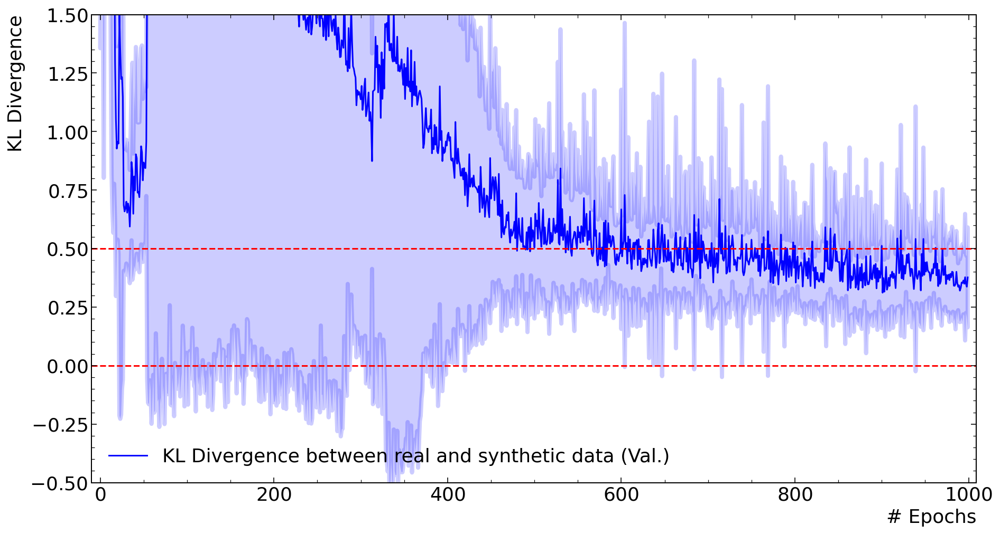

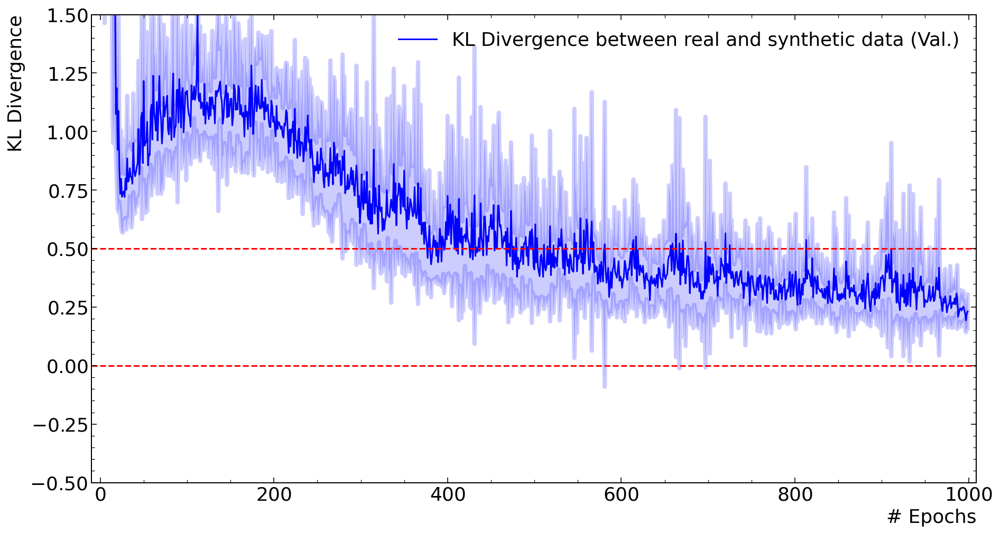

...

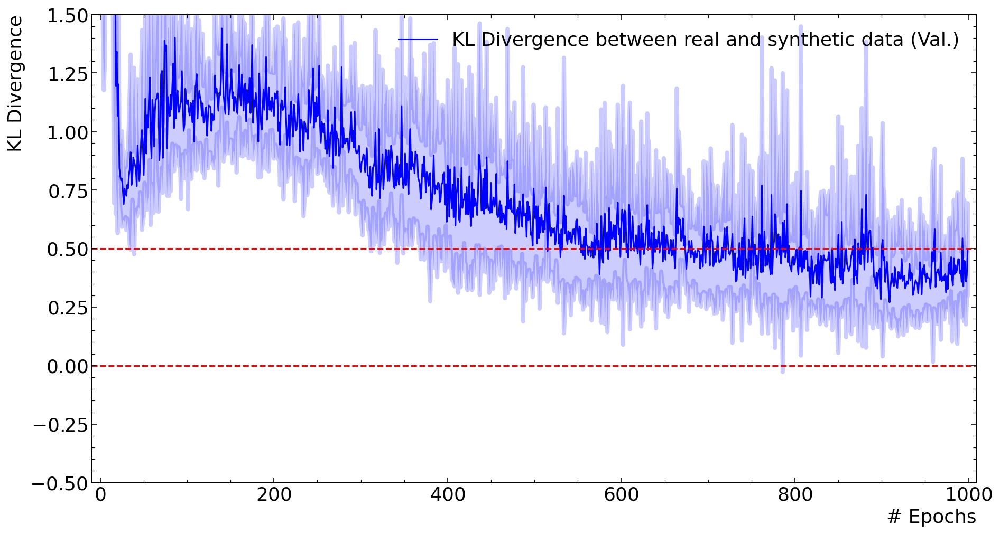

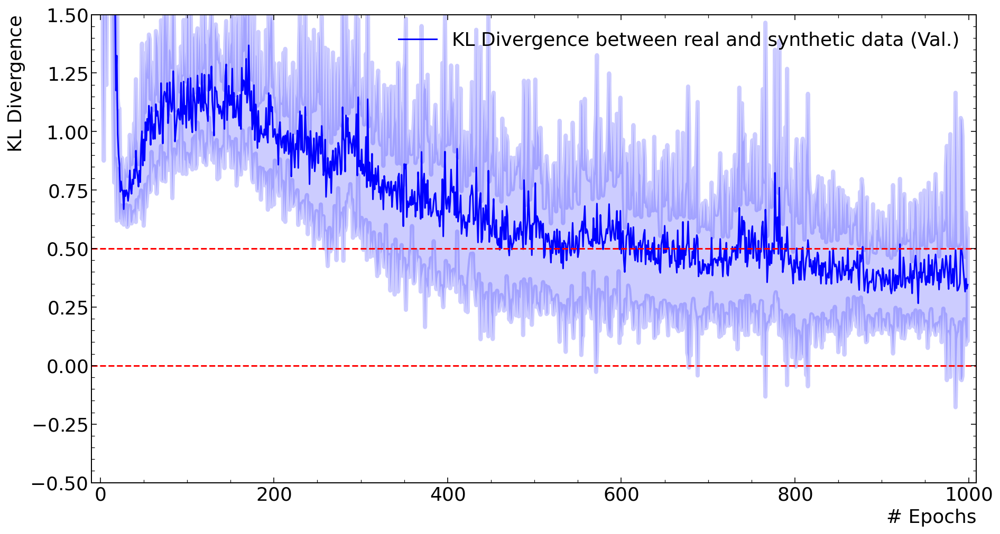

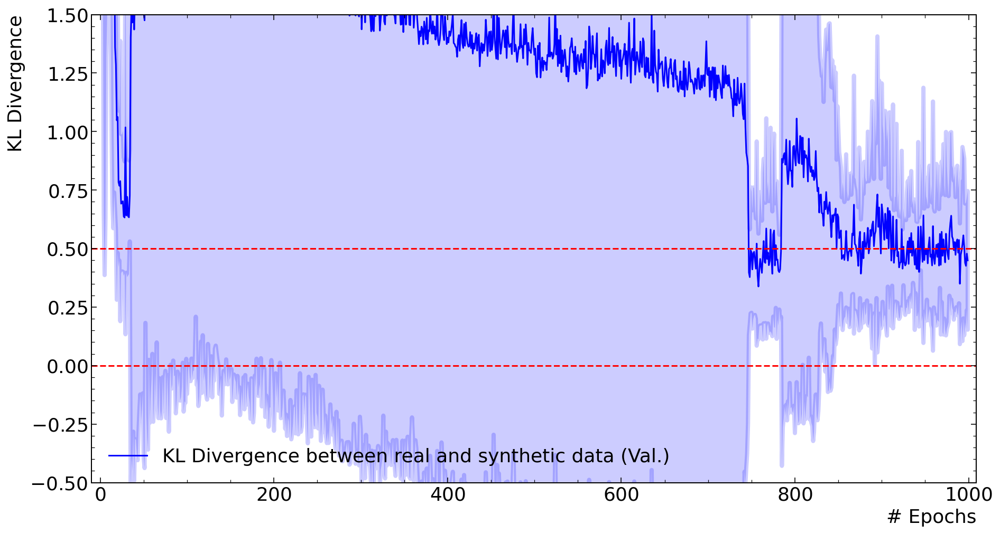

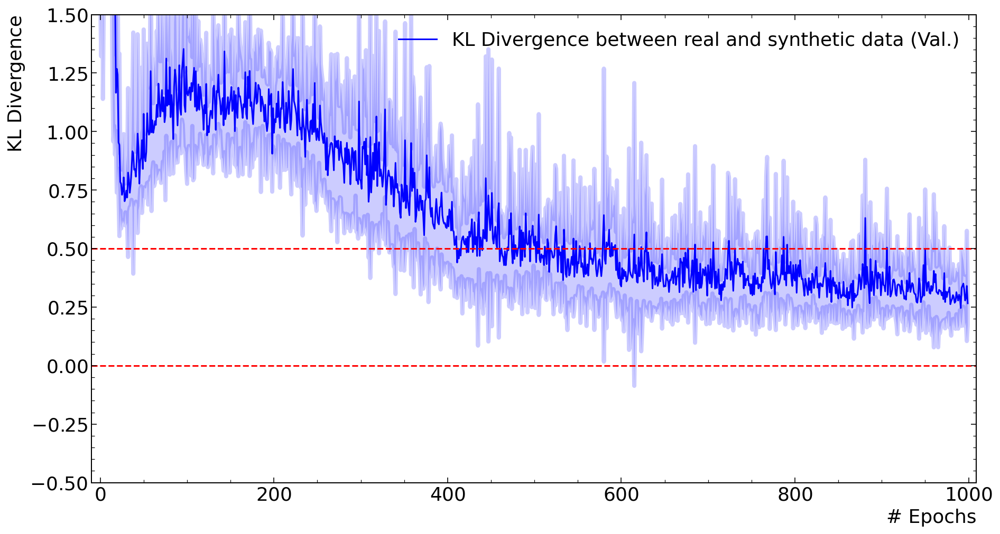

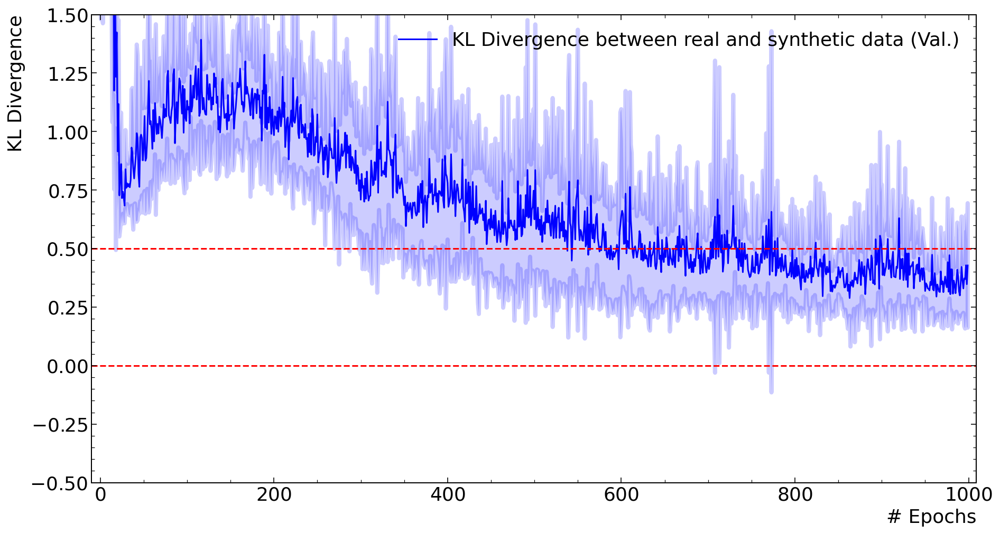

In [10]:

def plot_kl( df, output ):

    epochs = np.arange(0,1000,1)
    xmin = epochs[0]-10
    xmax = epochs[-1]+10
    fig = plt.figure(figsize=(15, 8))
    y_gen = get_values(df, 'val_kl_rf')
    y_gen_mean = y_gen.mean(axis=0)
    y_gen_std = y_gen.std(axis=0)
    plt.plot( epochs, y_gen_mean, label='KL Divergence between real and synthetic data (Val.)', color='blue')
    plt.fill_between(epochs, y_gen_mean-y_gen_std, y_gen_mean+y_gen_std, alpha=0.2, antialiased=True, 
                     color='blue',linewidth=4)

    plt.ylabel('KL Divergence',fontsize=18,loc='top')
    plt.xlabel("# Epochs",fontsize=18,loc='right')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.axhline(y=0.5, color='r', linestyle='--')


    ax = plt.gca()
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(-0.5,+1.5)
    plt.legend()
    plt.show()
    fig.savefig(output)
    
    
    
plot_kl(model_df, 'output/notb/val_kl_rf.pdf')

for test in range(10):
    plot_kl(model_df.loc[model_df.test==test], 'output/notb/val_kl_rf_test_%d.pdf'%test)

## Production:

In [11]:
dataprod_path = '/home/joao.pinto/public/brics_data/SantaCasa/synthetic/user.joao.pinto.images.SantaCasa.wgan.v2_notb.r1.sample_short.csv'

In [12]:
prod_df = pd.read_csv(dataprod_path)

In [13]:
prod_df

,Unnamed: 0,dataset_name,dataset_type,project_id,target,raw_image_path,insertion_date,metadata,date_acquisition,test,sort,type
0,0,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000000,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
1,1,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000001,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
2,2,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000002,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
3,3,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000003,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
4,4,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000004,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
...,...,...,...,...,...,...,...,...,...,...,...,...
14395,14395,SantaCasa_wgan_v2,fake,synthetic.notb.test_9.sort_8.000155,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,9,8,test
14396,14396,SantaCasa_wgan_v2,fake,synthetic.notb.test_9.sort_8.000156,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,9,8,test
14397,14397,SantaCasa_wgan_v2,fake,synthetic.notb.test_9.sort_8.000157,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,9,8,test
14398,14398,SantaCasa_wgan_v2,fake,synthetic.notb.test_9.sort_8.000158,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,9,8,test


In [14]:
real_samples = load_images( data_df.loc[(data_df.test==0)&(data_df.target==0)&(data_df.sort==0)&(data_df.dataset=='test') ], 256, 256 , rot=True)

Found 9 validated image filenames.


In [15]:
real_samples.shape

(9, 256, 256, 1)

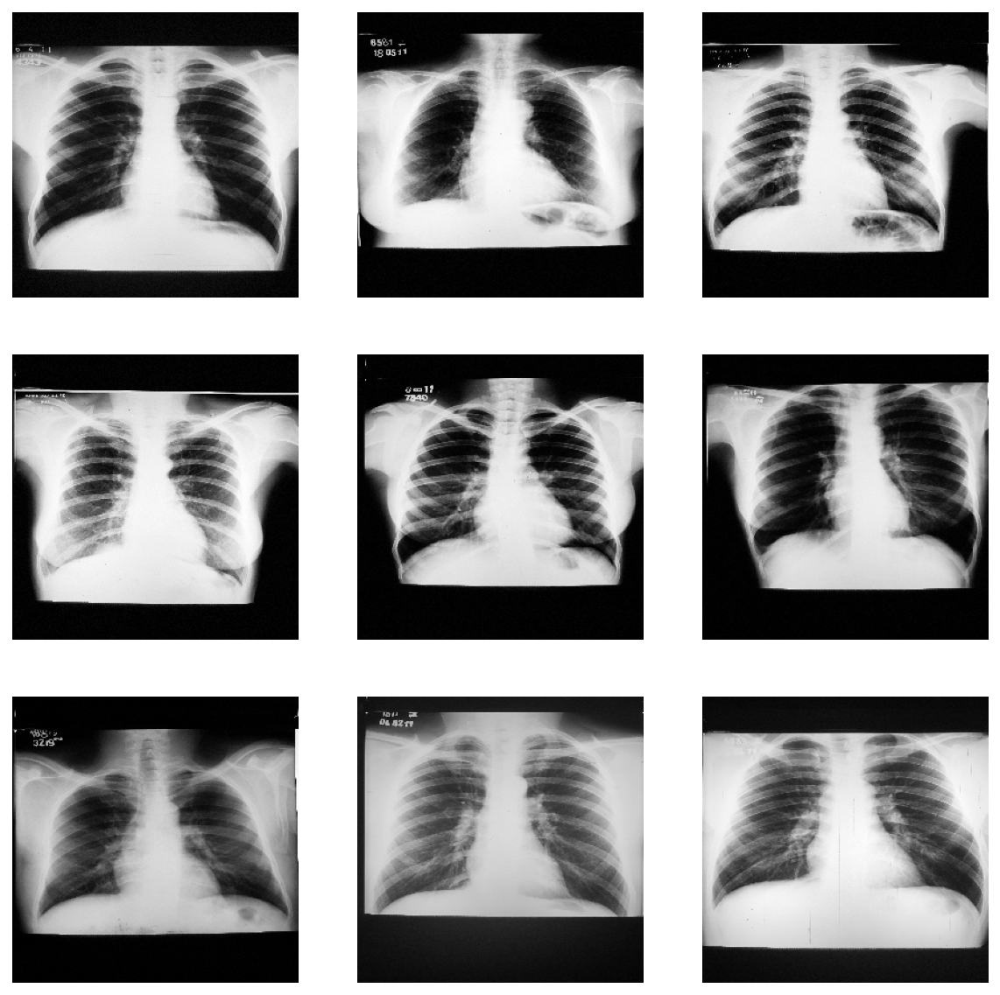

In [16]:
fig = display_images(real_samples)
fig.show()
fig.savefig(output_path+'/real_samples.pdf')

In [17]:
fake_samples = load_images(prod_df.loc[(prod_df.test==0)&(prod_df.target==0)&(prod_df.sort==0)&(prod_df.type=='test') ], 256, 256,tot=50 )

Found 160 validated image filenames.


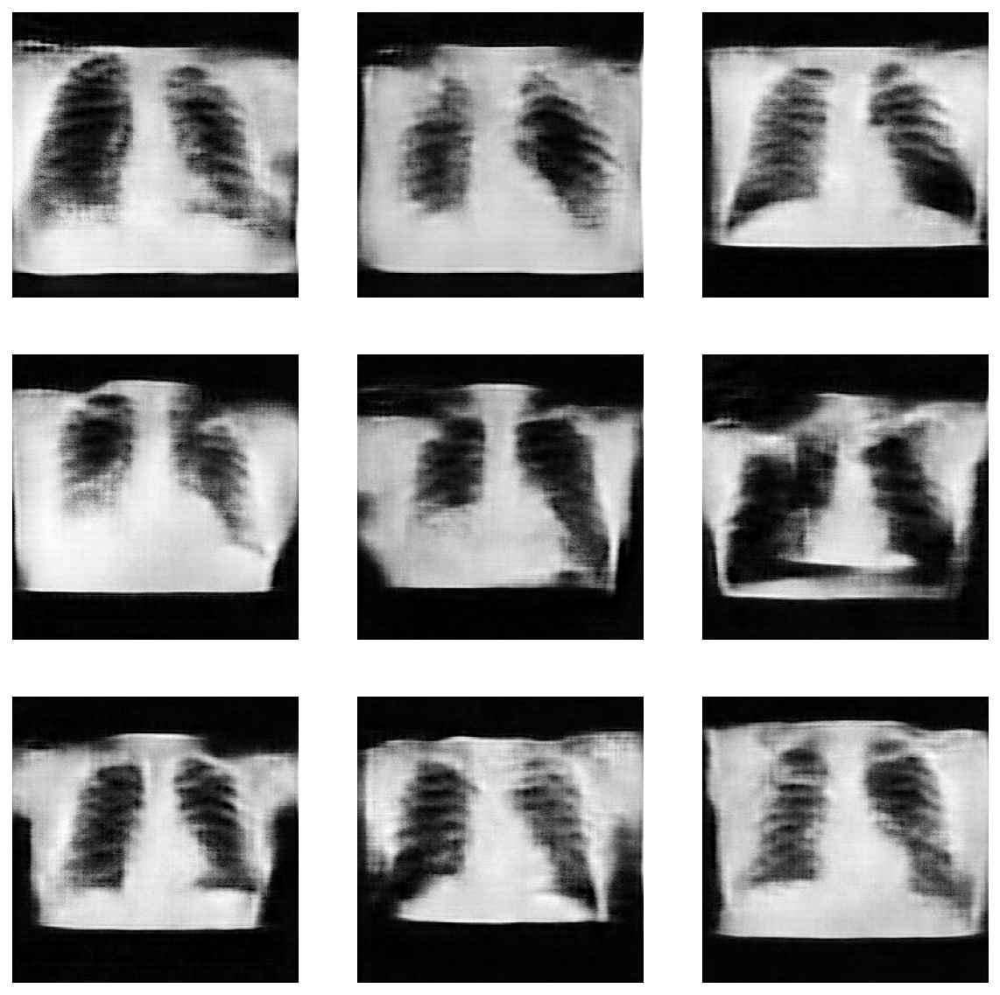

In [42]:
fig = display_images(fake_samples)
fig.show()
fig.savefig(output_path+'/fake_samples.pdf')

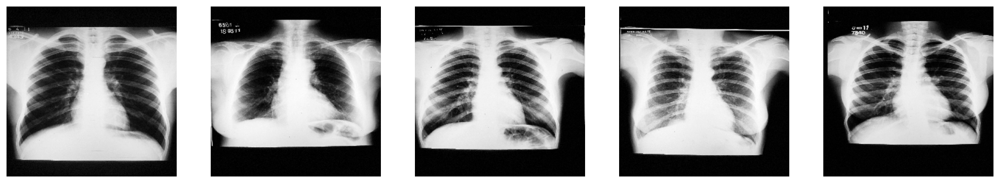

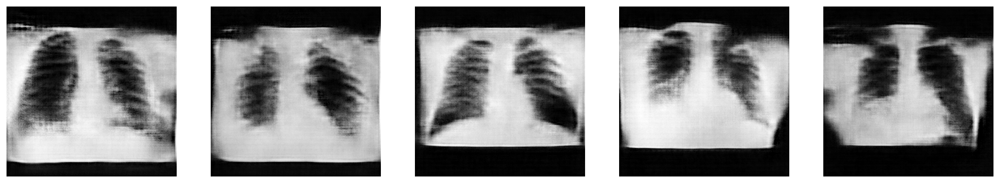

In [19]:
def display_5images(fake_samples):
    # disp plot
    fig = plt.figure(figsize=(15, 3))
    plt.subplots_adjust(left=0.01, right=0.99, top=0.99, bottom=0.01)

    for i in range(5):
        plt.subplot(1,5,1+i)
        plt.axis('off')
        plt.imshow(fake_samples[i],cmap='gray')
    return fig

fig = display_5images(real_samples)
fig.savefig(output_path+'/real_samples_5images.pdf')

fig = display_5images(fake_samples)
fig.savefig(output_path+'/fake_samples_5images.pdf')

In [50]:
prod_df.loc[(prod_df.test==0)&(prod_df.target==0)&(prod_df.sort==0)&(prod_df.type=='test')].head()

,Unnamed: 0,dataset_name,dataset_type,project_id,target,raw_image_path,insertion_date,metadata,date_acquisition,test,sort,type
0,0,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000000,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
1,1,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000001,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
2,2,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000002,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
3,3,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000003,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test
4,4,SantaCasa_wgan_v2,fake,synthetic.notb.test_0.sort_0.000004,0,/home/joao.pinto/public/brics_data/SantaCasa/s...,NaN,{},2023-01-04,0,0,test


## Calculate for each experiment

In [46]:

exp = {'test':[], 'sort':[], 'kl_rr':[],'kl_rf':[],'l1_rr':[],'l1_rf':[],'js_rr':[],'js_rf':[],'l2_rf':[],'l2_rr':[]}


for test in tqdm(range(10)):
    
    real_samples = load_images(data_df.loc[(data_df.test==test)&(data_df.target==0)&(data_df.sort==0)&(data_df.type=='test') ], 256, 256, rot=True )
    kl_rr, js_rr = calculate_divergences( real_samples, real_samples )
    l1_rr, l2_rr = calculate_l1_and_l2_norm_errors( real_samples, real_samples )

    for sort in range(9):  
        fake_samples = load_images(prod_df.loc[(prod_df.test==test)&(prod_df.target==0)&
                                               (prod_df.sort==sort)&(prod_df.type=='test') ], 256, 256 )
        kl_rf, js_rf = calculate_divergences( real_samples, fake_samples )
        l1_rf, l2_rf = calculate_l1_and_l2_norm_errors( real_samples, fake_samples )
        exp['kl_rr'].append(np.mean(kl_rr))
        exp['kl_rf'].append(np.mean(kl_rf))
        exp['js_rr'].append(np.mean(js_rr))
        exp['js_rf'].append(np.mean(js_rf))
        exp['l1_rr'].append(np.mean(l1_rr))
        exp['l1_rf'].append(np.mean(l1_rf))
        exp['l2_rr'].append(np.mean(l2_rr))
        exp['l2_rf'].append(np.mean(l2_rf))
        exp['test'].append(test)
        exp['sort'].append(sort)
        
exp_df = pd.DataFrame(exp)


  0%|                                          | 0/10 [00:00<?, ?it/s]


KeyError: 'raw_image_path'

In [ ]:
exp_df.head(10)

In [ ]:
fig, ax = plt.subplots(figsize=(18,6))
v = []
for test in range(10):
    v.append(exp_df.loc[exp_df.test==test]['kl_rr'].values - exp_df.loc[exp_df.test==test]['kl_rf'].values)
ax.set_title('KL Divergence (WGAN)')
ax.set_xlabel('Test',fontsize=18,loc='right')
ax.set_ylabel('KL_rr - KL_rf_sort_i',fontsize=18,loc='top')
ax.boxplot(v)
plt.axhline(y=0, color='r', linestyle='--')
plt.legend()
plt.show()
fig.savefig(output_path+'/kl_div_all_tests.pdf')

In [ ]:
fig, ax = plt.subplots(figsize=(18,6))
v = []
for test in range(10):
    v.append(exp_df.loc[exp_df.test==test]['l1_rr'].values - exp_df.loc[exp_df.test==test]['l1_rf'].values)
ax.set_title('L1 (WGAN)')
ax.set_xlabel('Test',fontsize=18,loc='right')
ax.set_ylabel('l1_rr - l1_rf_sort_i',fontsize=18,loc='top')
ax.boxplot(v)
plt.axhline(y=0, color='r', linestyle='--')
plt.legend()
plt.show()
fig.savefig(output_path+'/l1_all_tests.pdf')

In [ ]:
fig, ax = plt.subplots(figsize=(18,6))
v = []
for test in range(10):
    v.append(exp_df.loc[exp_df.test==test]['l2_rr'].values - exp_df.loc[exp_df.test==test]['l2_rf'].values)
ax.set_title('L2 (WGAN)')
ax.set_xlabel('Test',fontsize=18,loc='right')
ax.set_ylabel('l2_rr - l2_rf_sort_i',fontsize=18,loc='top')
ax.boxplot(v)
plt.axhline(y=0, color='r', linestyle='--')
plt.legend()
plt.show()
fig.savefig(output_path+'/l1_all_tests.pdf')

## Selected Fold and Test:

In [ ]:
test = 5; sort = 0

In [ ]:
dataprod_pix2pix_path = '/home/jodafons/public/brics_data/Shenzhen/fake_images/pix2pix/v1/user.otavares.Shenzhen.pix2pix.v1_tb.r1.csv'
p2p_df = pd.read_csv(dataprod_pix2pix_path)

In [ ]:
p2p_df.head()

In [ ]:
fig = display_5images(fake_p2p_samples)
fig.savefig(output_path+'/fake_samples_p2p_5images.pdf')

In [ ]:
critic_model = Critic(model_df.loc[(model_df.test==test)&(model_df.sort==sort)]['critic_path'].values[0])

In [ ]:
real_samples = load_images(data_df.loc[(data_df.test==test)&(data_df.target==0)&
                                       (data_df.sort==0)&(data_df.dataset=='test') ], 256, 256 )
fake_samples = load_images(prod_df.loc[(prod_df.test==test)&(prod_df.target==0)&
                                       (prod_df.sort==sort)&(prod_df.dataset=='test') ], 256, 256,tot=500 )
fake_p2p_samples = load_images(p2p_df.loc[(p2p_df.test==test)&(p2p_df.target==0)&
                                      (p2p_df.sort==sort)&(p2p_df.dataset=='test')&
                                      (p2p_df.type=='real')], 256, 256)

In [ ]:
output_real = critic_model.predict(real_samples).flatten()
output_fake = critic_model.predict(fake_samples).flatten()
output_p2p_fake = critic_model.predict(fake_p2p_samples).flatten()

In [ ]:
xmin=0
xmax=5
bins=50
score = np.mean(output_real) - output_fake
xlabel='|E[out_r] - out_f|'
fig, ax = plt.subplots(figsize=(10, 8))
binwidth = (xmax-xmin)/bins
bins_vec=np.arange(xmin, xmax + binwidth, binwidth)
#ax.set_title(title)
# plot histogram centered on values 0..255
a_pdf = ax.hist(score, bins=bins_vec, histtype='step', color='k', 
                             lw=1.5, label=xlabel, density=False)
ax.set_xlabel(xlabel, fontsize=18, loc='right')
ax.set_ylabel('Count', fontsize=18, loc='top')
ax.legend(loc='best', fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
score

No handles with labels found to put in legend.


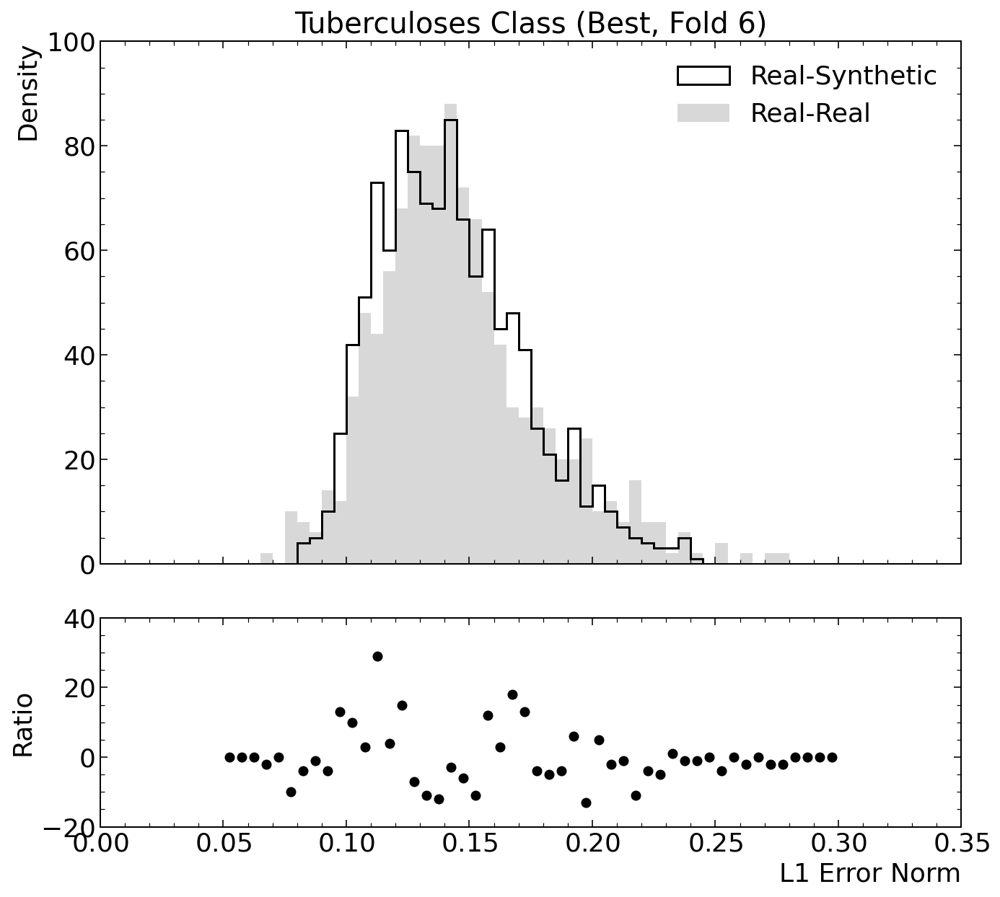

In [86]:
fig,_,_ = plot_hist( test_l1_rf, test_l1_rr , 0.05, 0.3, 50, ylabel=('Density', 'Ratio'),
                     density=False, xlabel='L1 Error Norm',
                     title='Tuberculoses Class (Best, Fold %d)'%best_sort,
                     labels=('Real-Synthetic', 'Real-Real'), colors=['black', 'gray'])
fig.savefig(output_path+'/l1_norm_dist.pdf')

No handles with labels found to put in legend.


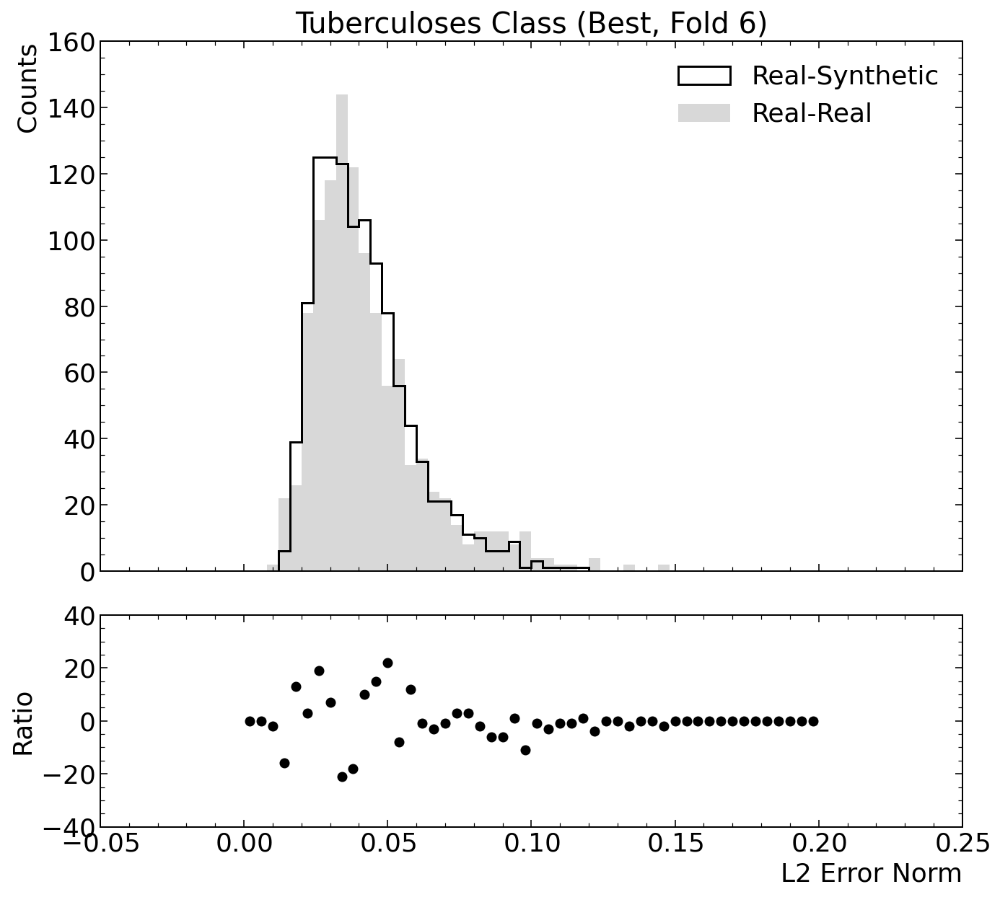

In [87]:
fig,_,_ = plot_hist( test_l2_rf, test_l2_rr ,0, 0.2, 50, ylabel=('Counts', 'Ratio'),density=False, 
                 xlabel='L2 Error Norm',
                 title='Tuberculoses Class (Best, Fold %d)'%best_sort,
                 labels=('Real-Synthetic', 'Real-Real'), colors=['black', 'gray'])
fig.savefig(output_path+'/l2_norm_dist.pdf')

No handles with labels found to put in legend.


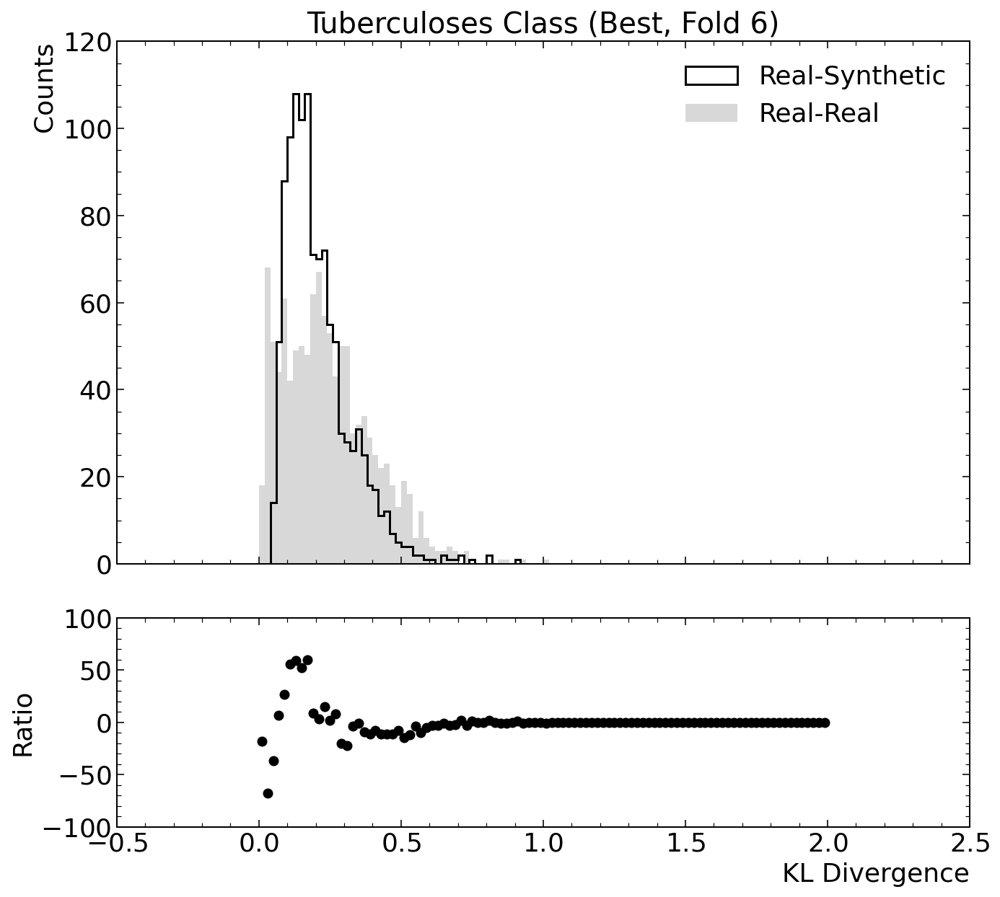

In [88]:
fig,_, _ = plot_hist( test_kl_rf, test_kl_rr , 0, 2, 100, ylabel=('Counts', 'Ratio'),density=False, 
                 xlabel='KL Divergence', alpha=0.3,
                 title='Tuberculoses Class (Best, Fold %d)'%best_sort,
                 labels=('Real-Synthetic', 'Real-Real'), colors=['black', 'gray'])
fig.savefig(output_path+'/kl_divergence_dist.pdf')

### 4 Generate Images:

In [89]:
real_samples = load_images( my_df.loc[my_df.target==target], gen_model.height,gen_model.width)
print(real_samples.shape)

Found 336 validated image filenames.
(336, 256, 256, 1)


In [90]:
output_real = critic_model.predict(real_samples).flatten()
mean_real = np.mean(output_real)
print(mean_real)

/usr/local/lib/python3.6/dist-packages/tensorflow/python/data/ops/dataset_ops.py:3350: UserWarning: Even though the tf.config.experimental_run_functions_eagerly option is set, this option does not apply to tf.data functions. tf.data functions are still traced and executed as graphs.
  "Even though the tf.config.experimental_run_functions_eagerly "


1/1 [==============================] - ETA:  - 0s 2ms/step
-9.465413


In [91]:
fake_samples = gen_model.generate( 326 )
output_fake = critic_model.predict(fake_samples).flatten()

1/1 [==============================] - ETA:  - 0s 5ms/step


In [92]:
score =  abs(mean_real - output_fake)

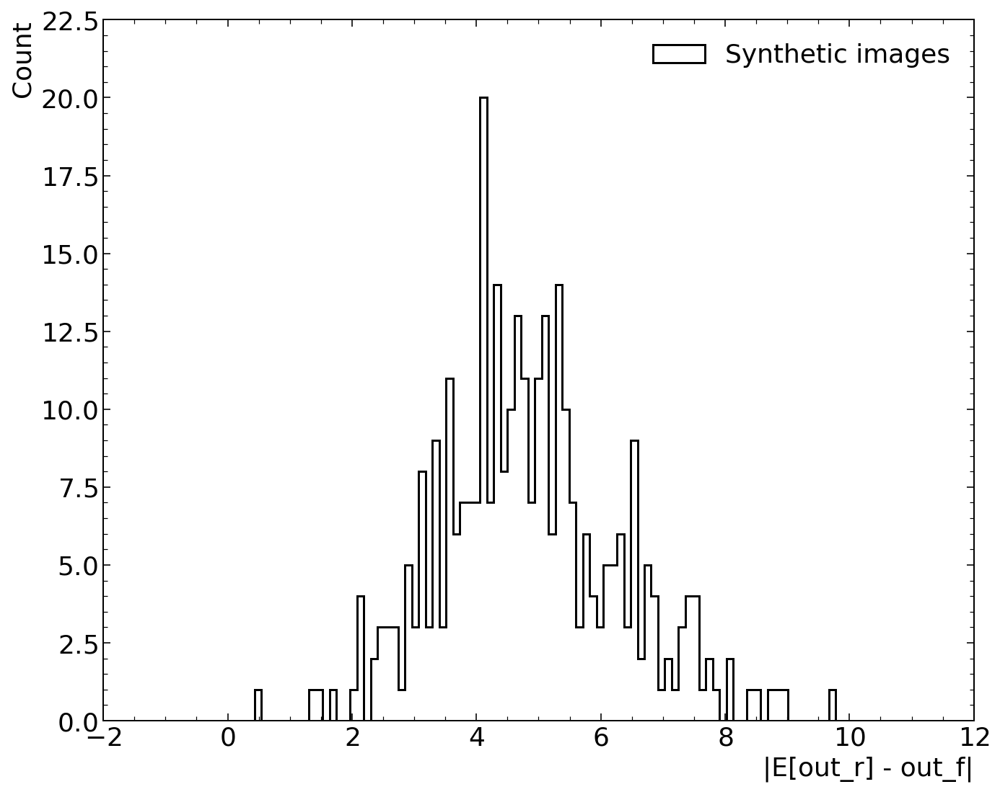

In [93]:
#fig.savefig(output_path+'/kl_divergence_dist.pdf')
def plot_1hist( a, xmin, xmax, bins=100, xlabel='',ylabel='Count', density=False, alpha=0.3, title=None, colors='black', labels='Synthetic images'):
    
    fig, ax_top = plt.subplots(figsize=(10, 8))
    #print(fig.axes)
    #ax_top = fig.axes
    binwidth = (xmax-xmin)/bins
    bins_vec=np.arange(xmin, xmax + binwidth, binwidth)
    if title:
        ax_top.set_title(title)
    # plot histogram centered on values 0..255
    a_pdf = ax_top.hist(a, bins=bins_vec, histtype='step', color=colors, 
                             lw=1.5, label=labels, density=density)
    ax_top.set_xlabel(xlabel, fontsize=18, loc='right')
    ax_top.set_ylabel(ylabel, fontsize=18, loc='top')
    ax_top.legend(loc='best', fontsize=18)
    plt.tight_layout()
    plt.show()
    return fig

fig = plot_1hist( score, -1, 10, 100, xlabel='|E[out_r] - out_f|')
fig.show()


In [94]:
img_df = pd.DataFrame( {'score' : score, 'image':fake_samples.tolist()} )
img_df = img_df.sort_values(by = 'score', ascending = True)

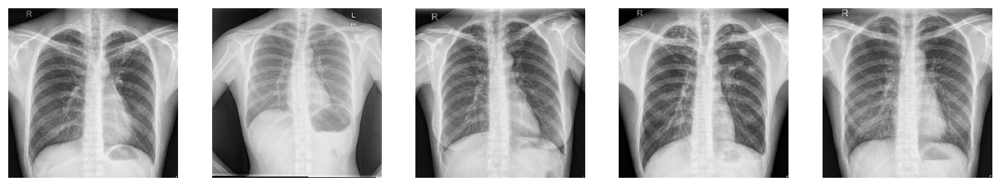

In [95]:



fig = display_5images(real_samples)
fig.show()
fig.savefig('real_tb_slice.pdf')

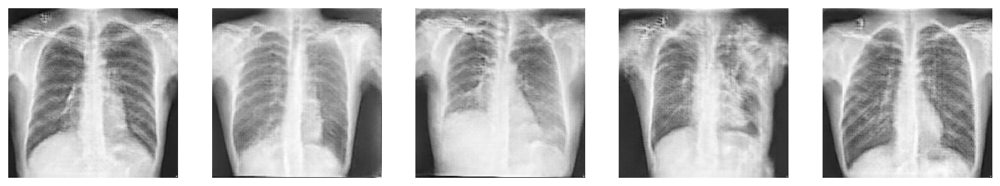

In [99]:
fake_samples = gen_model.generate( 5 )
fig = display_5images(fake_samples)
fig.show()
fig.savefig('fake_tb_slice.pdf')

In [ ]:
def display_all_images(samples, output, tot, y):
    x = int(tot / y)
    fig = plt.figure(figsize=(50, 200))
    print(x)
    print(y)
    for i in range(tot):
        plt.subplot(x,y,i+1)
        plt.axis('off')
        plt.title('%1.2f'%output[i])
        plt.imshow(samples[i],cmap='gray')
    return fig
fig=display_all_images(img_check.image.values, img_check.score.values, tot = 300, y = 10)

fig.show()
fig.savefig('fake_score.pdf')

